Name: Nuray Akar
Student Id: 2380004

In [1]:
from PIL import Image
import numpy as np
from scipy import signal
import matplotlib.pyplot as plt
import math
import cv2

In [2]:
images = []
with Image.open("chessboard.png") as im:
        chess = np.asarray(im)
        images.append(chess)
with Image.open("chessboardrotated.png") as im:
        chess_rotated = np.asarray(im)
        images.append(chess_rotated)
with Image.open("agac.png") as im:
        agac = np.asarray(im)
        images.append(agac)
with Image.open("agacrotated.png") as im:
        agac_rotated = np.asarray(im)
        images.append(agac_rotated)
with Image.open("lab.png") as im:
        lab = np.asarray(im)
        images.append(lab)
with Image.open("labrotated.png") as im:
        lab_rotated = np.asarray(im)
        images.append(lab_rotated)

In [3]:
def rgb2gray(rgb):

    r, g, b = rgb[:,:,0], rgb[:,:,1], rgb[:,:,2]
    gray = 0.2989 * r + 0.5870 * g + 0.1140 * b

    return gray

In [4]:
# SOBEL OPERATORS
Gx = np.array([
    [1, 0, -1],
    [2, 0, -2],
    [1, 0, -1]
])

Gy = np.array([
    [1, 2, 1],
    [0, 0, 0],
    [-1, -2, -1]
])

In [5]:
def sobel_operator(photo):    
    Ix = signal.convolve2d(photo, Gx, mode="same", boundary="symm")
    Iy = signal.convolve2d(photo, Gy, mode="same", boundary="symm")
    Ixx = np.square(Ix)
    Iyy = np.square(Iy)
    Ixy = Ix*Iy
    Iyx = Iy*Ix
    return Ixx, Ixy, Iyy, Iyx


### Task 1: Naive Formula + Uniform Weighting

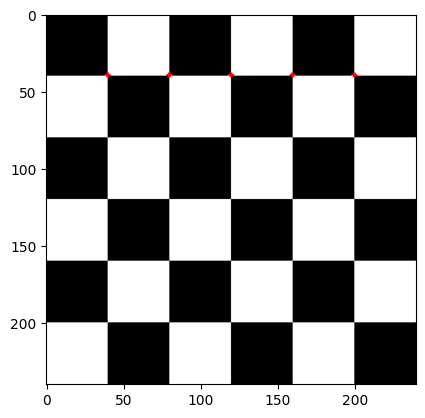

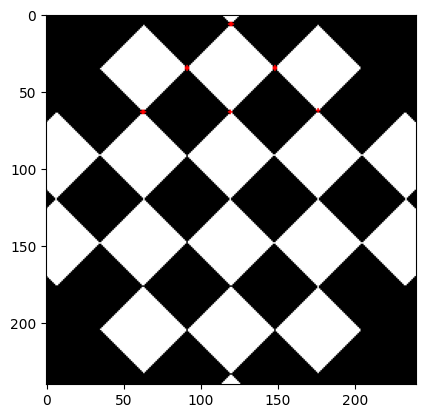

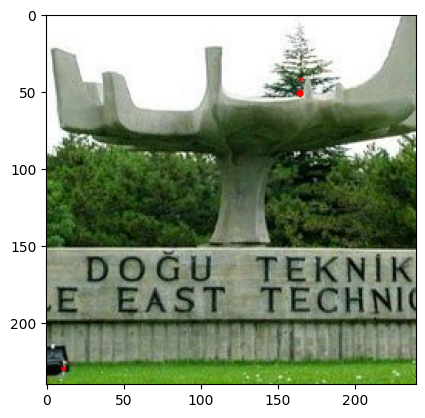

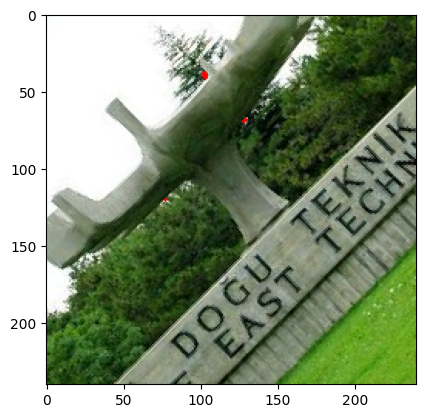

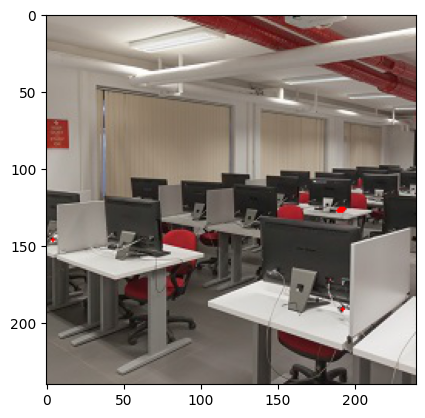

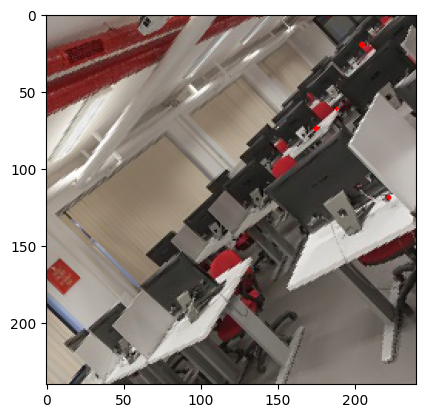

In [6]:
## Write your code here
def E(img1, img2):
    difference = np.subtract(img2, img1)
    power = np.power(difference, 2)
    result =  np.sum(power)
    return result

    
def task1(img):
    new_img = np.copy(img)
    gray_img = rgb2gray(img)
    k=10
    window_size = 3
    start = math.ceil(window_size/2)
    stop = window_size + start
    length = len(gray_img)
    j=0
    result=[]
    pairs = [(1,-1),(1,0),(1,1),(0,-1),(0,1),(-1,-1),(-1,0),(-1,1)]
    stop_there = length-stop
    for i in range(0,stop_there):
        for j in range(0,stop_there):
            sum = 0
            for u,v in pairs:
                sum +=E(gray_img[i+start:i+stop,j+start:j+stop], 
                gray_img[i+start+u:i+stop+u,j+start+v:j+stop+v] )
            result.append([sum,[i+window_size,j+window_size]])
            
    result.sort(key=lambda element:element[0],reverse=True)
    for p in result[:10]: #top ten
        x=p[1][0]
        y=p[1][1]
        new_img[x][y]=[255,0,0]
        new_img[x+1][y]=[255,0,0]
        new_img[x-1][y]=[255,0,0]
        new_img[x][y+1]=[255,0,0]
        new_img[x][y-1]=[255,0,0]
    plt.imshow(new_img)
    plt.show()

for image in images:
    task1(image)

In [63]:
## This part is for discussion
'''
It takes 35.1 second to run this algorith for all 6 images.
When I run images one by one:
Chess: 6.3 s
Rotated Chess: 6.5 s
Agac: 6.7 s
Rotated Agac: 6.9 s
Lab: 6.7 s
Rotated Lab: 6.1 s

As one can see from the annotated images, even though I have chosen the best 10 scores, there are less points since we don't use non-maximum suppression.
The algorithm paints pixels close to each other.
Rotation changes the position of the top ten corners since I have chosen the top 10 scores in order of pixels.
Run time of this algorithm is worse than most of the other tasks except task3.
'''


"\nIt takes 35.1 second to run this algorith for all 6 images.\nWhen I run images one by one:\nChess: 6.3 s\nRotated Chess: 6.5 s\nAgac: 6.7 s\nRotated Agac: 6.9 s\nLab: 6.7 s\nRotated Lab: 6.1 s\n\nAs one can see from the annotated images, even though I have chosen the best 10 scores, there are less points since we don't use non-maximum suppression.\nThe algorithm paints pixels close to each other.\nRotation changes the position of the top ten corners since I have chosen the top 10 scores in order of pixels.\nRun time of this algorithm is worse than most of the other tasks except task3.\n"

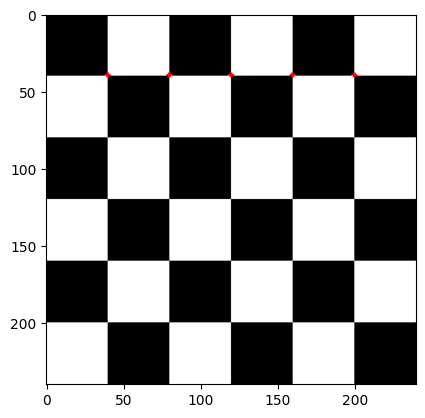

In [8]:
task1(chess)

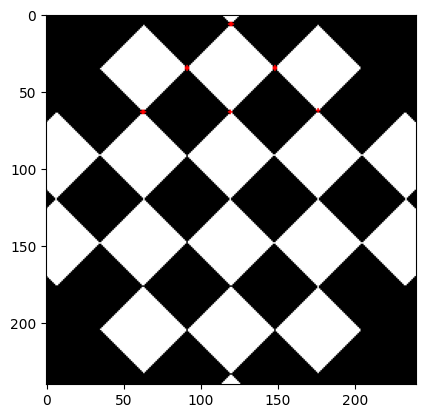

In [9]:
task1(chess_rotated)

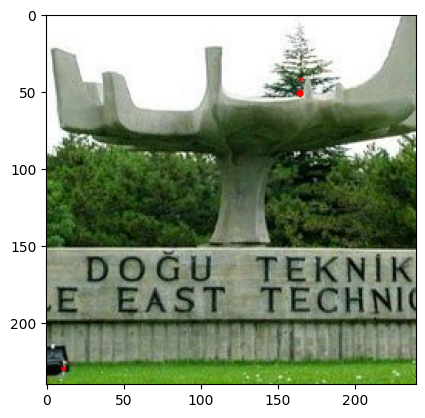

In [10]:
task1(agac)

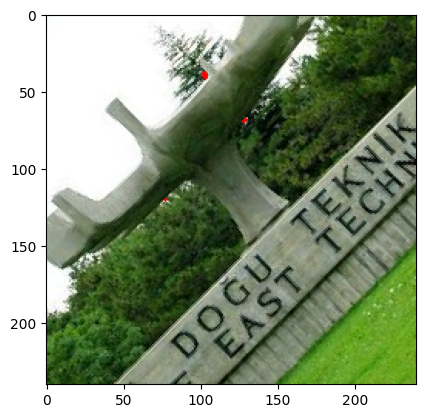

In [11]:
task1(agac_rotated)

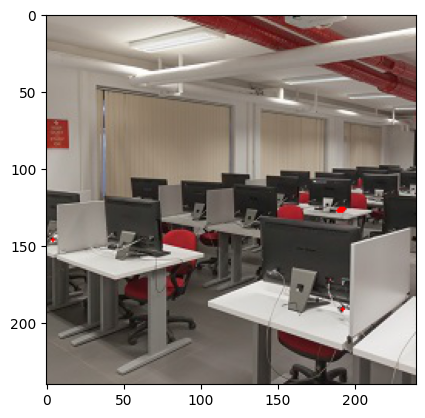

In [12]:
task1(lab)

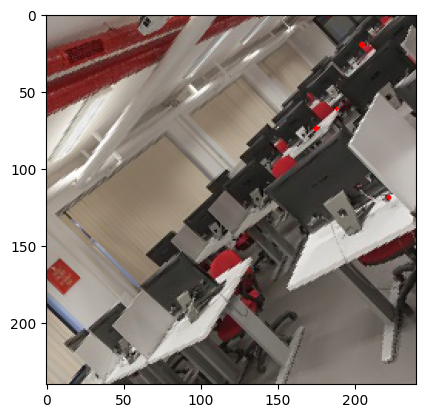

In [13]:
task1(lab_rotated)

### Task2: Naive Formula + Uniform Weighting + Non-Maximum Suppression

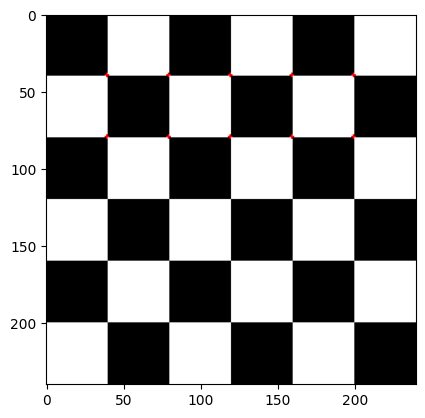

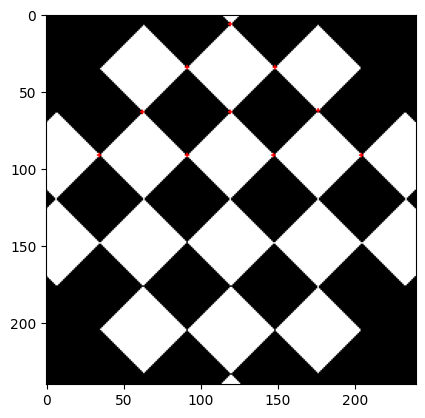

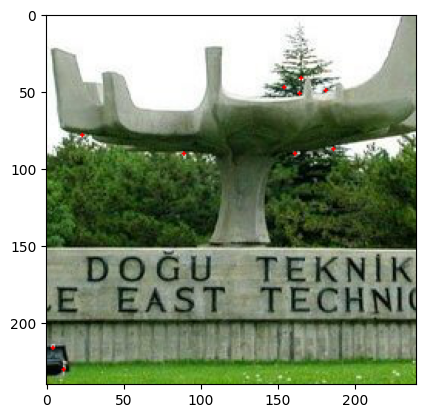

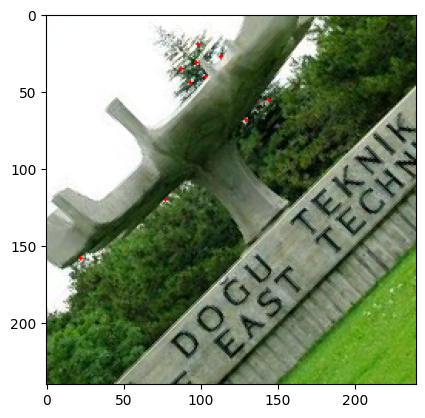

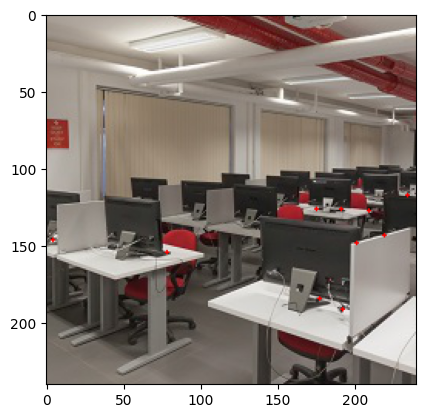

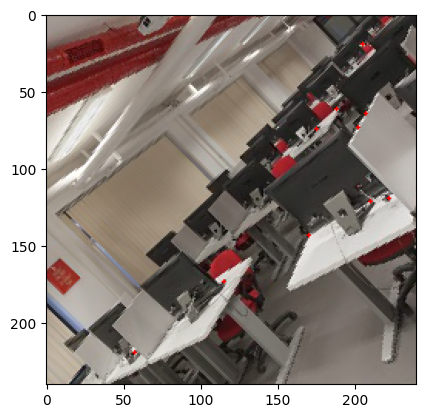

In [14]:
## Write your code here
def E2(img1, img2):
    difference = np.subtract(img2, img1)
    power = np.power(difference, 2)
    result =  np.sum(power)
    return result

def is_neighbor(p1, p2):
    np1 = np.asarray(p1)
    np2 = np.asarray(p2)
    subs = np.subtract(np1,np2)
    norm = np.linalg.norm(subs)
    if(norm<=10):
        return True
    return False

def task2(img):
    new_img = np.copy(img)
    gray_img = rgb2gray(img)
    k=10
    window_size = 3
    start = math.ceil(window_size/2)
    stop = window_size + start
    length = len(gray_img)
    j=0
    result=[]
    pairs = [(1,-1),(1,0),(1,1),(0,-1),(0,1),(-1,-1),(-1,0),(-1,1)]
    stop_there = length-stop
    for i in range(0,stop_there):
        for j in range(0,stop_there):
            sum = 0
            for u,v in pairs:
                sum +=E2(gray_img[i+start:i+stop,j+start:j+stop], 
                gray_img[i+start+u:i+stop+u,j+start+v:j+stop+v] )
            result.append([sum,[i+window_size,j+window_size]])
            
    result.sort(key=lambda element:element[0],reverse=True)
    
    corners = []
    corners.append(result[0][1])
    num=1
    for i in range(1,len(result)): # nms
        j=0
        is_neg = False
        while(j<len(corners)):
            p=corners[j]
            if((is_neighbor(p,result[i][1]))):
                is_neg = True
                break
            j+=1
        if(not is_neg):
            corners.append(result[i][1])
            num+=1
        if(num==10):
            break

    for p in corners:
        x=p[0]
        y=p[1]
        new_img[x][y]=[255,0,0]
        new_img[x+1][y]=[255,0,0]
        new_img[x-1][y]=[255,0,0]
        new_img[x][y+1]=[255,0,0]
        new_img[x][y-1]=[255,0,0]
    plt.imshow(new_img)
    plt.show()


for image in images:
    task2(image)

In [62]:
## This part is for discussion
'''It takes 33.1 second to run this algorith for all 6 images.
Chess: 5.6 s
Rotated Chess: 5.3 s
Agac: 5.3 s
Rotated Agac: 5.3 s
Lab: 5.2 s
Rotated Lab: 5.2 s

In this part, there are exactly 10 points, since we started to use non-maximum suppression.
Rotation does not change the position of the corners much except chessboard. 
Since I have found the top 10 in order of pixels and every corner has same score approximately for chessboard, their positions changed.
Its run time is better than task3, but worse than further tasks.
'''



'It takes 33.1 second to run this algorith for all 6 images.\nChess: 5.6 s\nRotated Chess: 5.3 s\nAgac: 5.3 s\nRotated Agac: 5.3 s\nLab: 5.2 s\nRotated Lab: 5.2 s\n\nIn this part, there are exactly 10 points, since we started to use non-maximum suppression.\nRotation does not change the position of the corners much except chessboard. \nSince I have found the top 10 in order of pixels and every corner has same score approximately for chessboard, their positions changed.\nIts run time is better than task3, but worse than further tasks.\n'

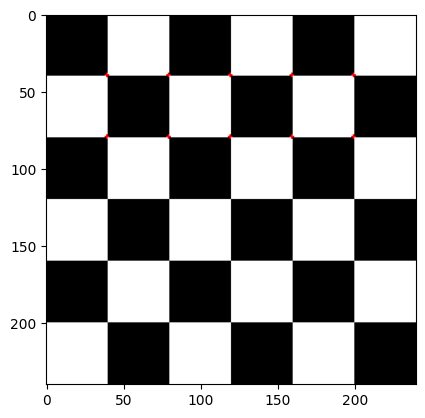

In [16]:
task2(chess)

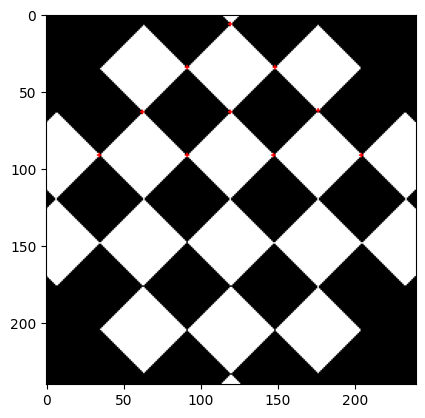

In [17]:
task2(chess_rotated)

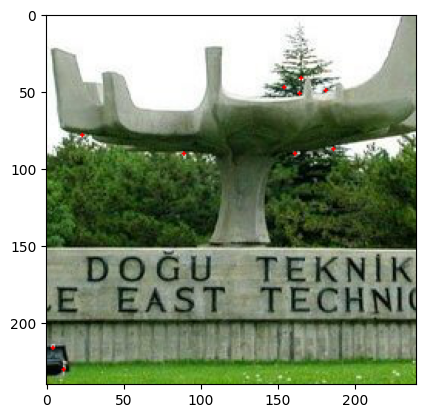

In [18]:
task2(agac)

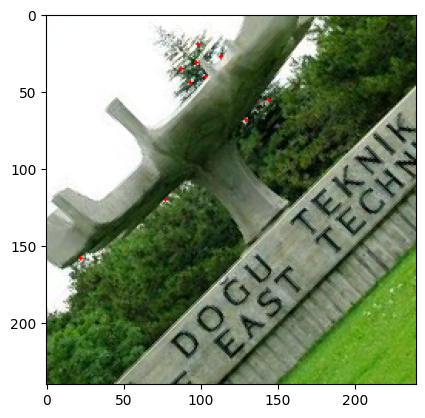

In [19]:
task2(agac_rotated)

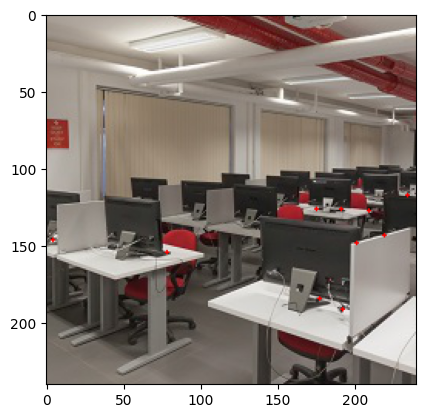

In [20]:
task2(lab)

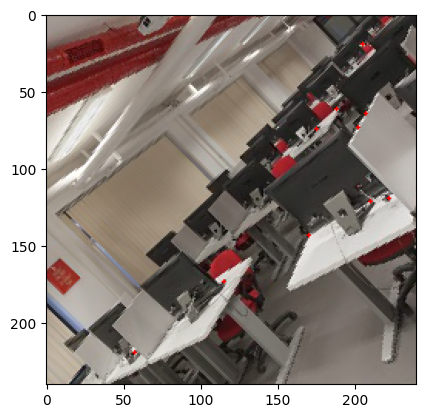

In [21]:
task2(lab_rotated)

### Task3: Taylor's Approximation + Uniform Weighting + Non-Maximum Suppression

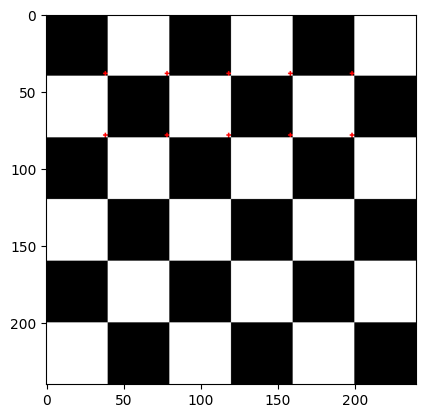

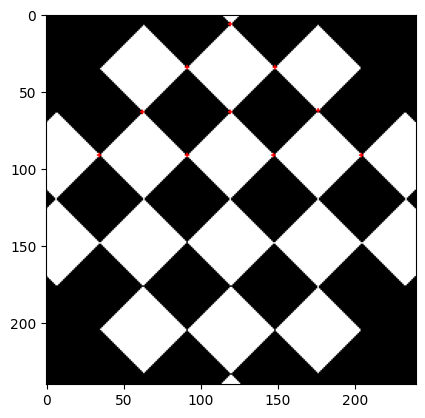

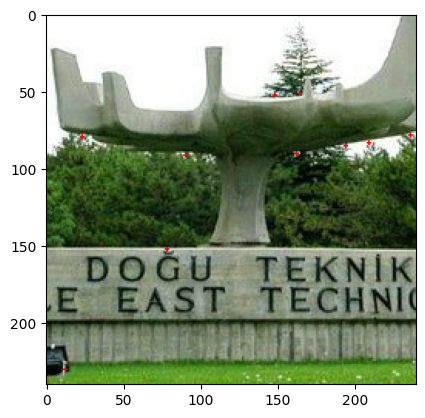

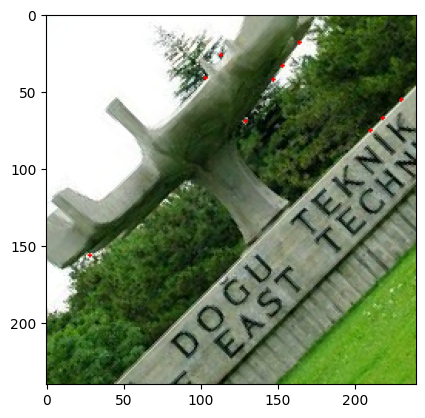

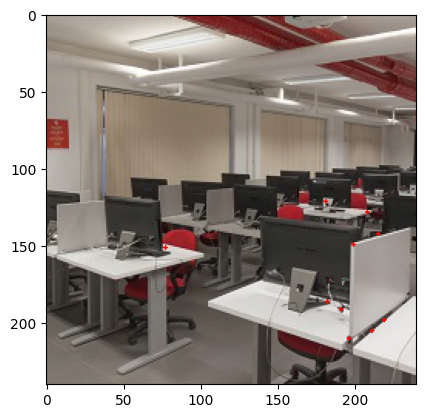

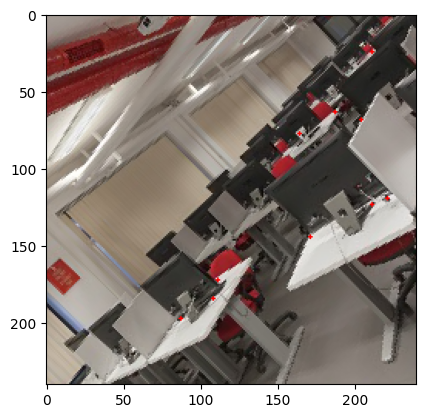

In [22]:
## Write your code here
def E3(u_v, start_x, stop_x, start_y, stop_y, Ixx, Ixy, Iyy, Iyx):
    sum=0
    u_v = np.array(u_v)
    t_u_v = np.transpose(u_v)
    m_sum = np.array([[np.sum(Ixx[start_x:stop_x, start_y: stop_y]),np.sum(Ixy[start_x:stop_x, start_y: stop_y])],
              [np.sum(Iyx[start_x:stop_x, start_y: stop_y]),np.sum(Iyy[start_x:stop_x, start_y: stop_y])]])
    mult = np.matmul(m_sum, t_u_v)
    sum = np.matmul(u_v, mult)
    return sum

def is_neighbor(p1, p2):
    np1 = np.asarray(p1)
    np2 = np.asarray(p2)
    subs = np.subtract(np1,np2)
    norm = np.linalg.norm(subs)
    if(norm<=10):
        return True
    return False

def task3(img):
    u_v_pairs = [[1,-1],[1,0],[1,1],[0,-1],[0,1],[-1,-1],[-1,0],[-1,1]]
    new_img = np.copy(img)
    gray_img = rgb2gray(img)
    Ixx, Ixy, Iyy, Iyx = sobel_operator(gray_img)
    window_size = 5
    mid = math.floor(window_size/2) #2
    length = len(gray_img)
    j=0
    result=[]
    stop_there = length-window_size
    for i in range(0,stop_there):
        for j in range(0,stop_there):
            sum = 0
            for u_v in u_v_pairs:
                sum +=E3(u_v,i,i+window_size,j,j+window_size, Ixx, Ixy, Iyy, Iyx)
            result.append([sum,[i+mid,j+mid]])
            
    result.sort(key=lambda element:element[0],reverse=True)

    corners = []
    corners.append(result[0][1])
    num=1
    for i in range(1,len(result)):
        j=0
        is_neg = False
        while(j<len(corners)):
            p=corners[j]
            if((is_neighbor(p,result[i][1]))):
                is_neg = True
                break
            j+=1
        if(not is_neg):
            corners.append(result[i][1])
            num+=1
        if(num==10):
            break

    for p in corners:
        x=p[0]
        y=p[1]
        new_img[x][y]=[255,0,0]
        new_img[x+1][y]=[255,0,0]
        new_img[x-1][y]=[255,0,0]
        new_img[x][y+1]=[255,0,0]
        new_img[x][y-1]=[255,0,0]
    plt.imshow(new_img)
    plt.show()

for image in images:
    task3(image)

In [68]:
## This part is for discussion
'''It takes 1 minute and 26.9 second to run this algorith for all 6 images.
Chess: 15.4 s
Rotated Chess: 16.3 s
Agac: 14.8 s
Rotated Agac: 15.2 s
Lab: 14.8 s
Rotated Lab: 14.9 s

Rotation changed the position of the top 10 corners a little bit.
This task has the worst running time.
'''


'It takes 1 minute and 26.9 second to run this algorith for all 6 images.\nChess: 15.4 s\nRotated Chess: 16.3 s\nAgac: 14.8 s\nRotated Agac: 15.2 s\nLab: 14.8 s\nRotated Lab: 14.9 s\n\nRotation changed the position of the top 10 corners a little bit.\nThis task has the worst running time.\n'

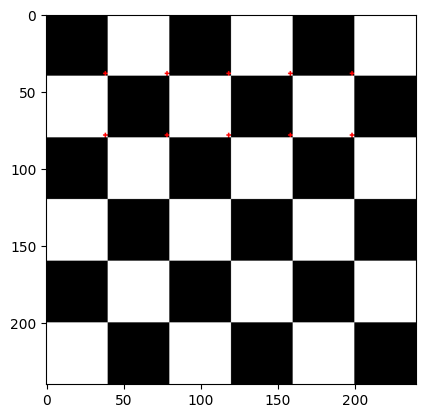

In [24]:
task3(chess)

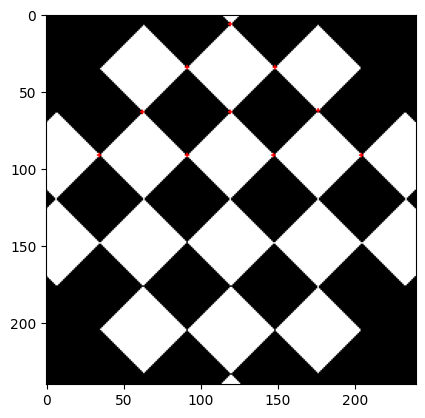

In [25]:
task3(chess_rotated)

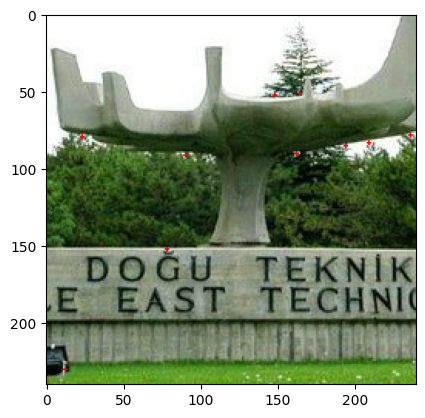

In [26]:
task3(agac)

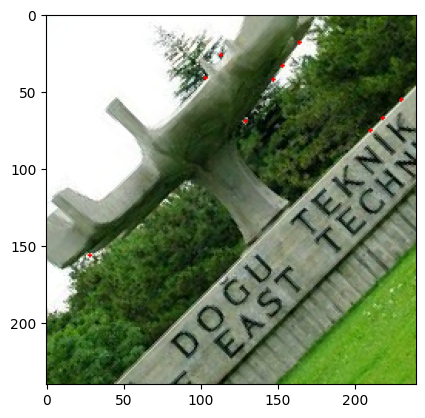

In [27]:
task3(agac_rotated)

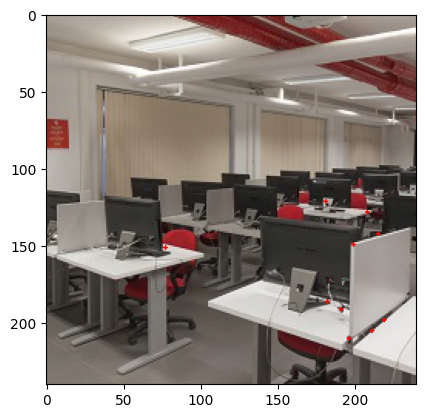

In [28]:
task3(lab)

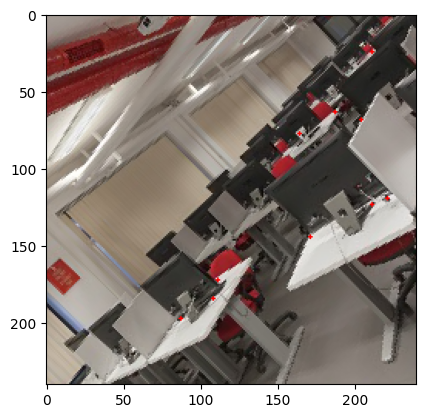

In [29]:
task3(lab_rotated)

### Task 4: Smaller Eigenvalue as corner score + Uniform Weighting + Non-Maximum Suppression

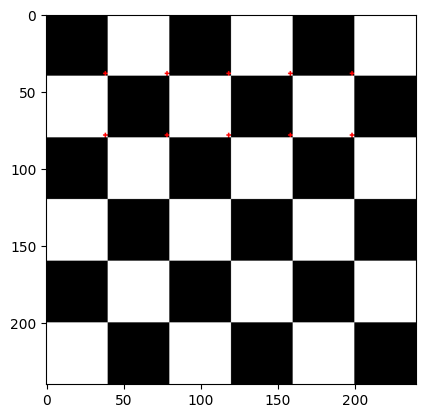

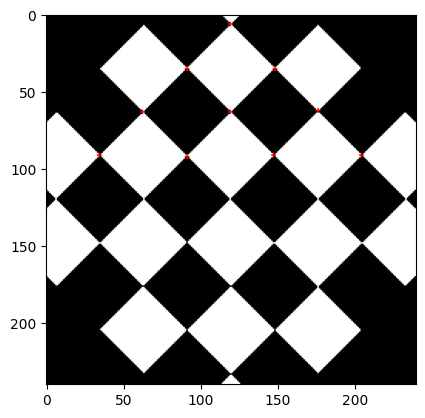

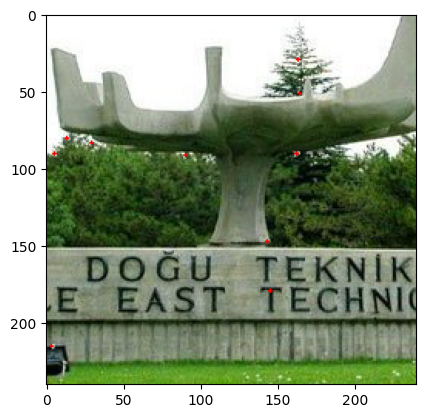

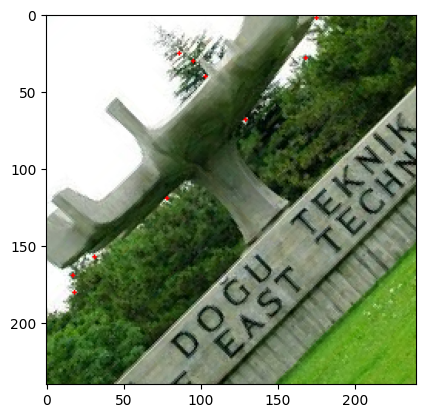

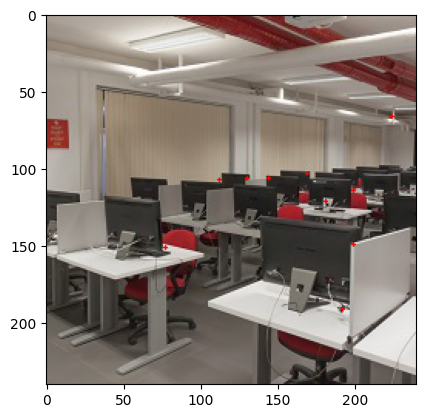

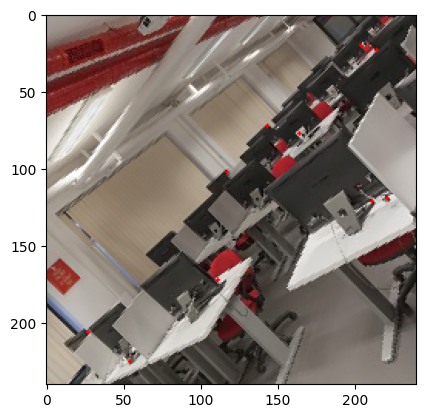

In [30]:
## Write your code here

def calculate_eigens(start_x, stop_x, start_y, stop_y, Ixx, Ixy, Iyy, Iyx):
    H = np.array([[np.sum(Ixx[start_x:stop_x, start_y: stop_y]),np.sum(Ixy[start_x:stop_x, start_y: stop_y])],
              [np.sum(Iyx[start_x:stop_x, start_y: stop_y]),np.sum(Iyy[start_x:stop_x, start_y: stop_y])]])
    H = np.linalg.eigvals(H)
    return H

def is_neighbor(p1, p2):
    np1 = np.asarray(p1)
    np2 = np.asarray(p2)
    subs = np.subtract(np1,np2)
    norm = np.linalg.norm(subs)
    if(norm<=10):
        return True
    return False

def task4(img):
    new_img = np.copy(img)
    gray_img = rgb2gray(img)
    Ixx, Ixy, Iyy, Iyx = sobel_operator(gray_img)
    window_size = 5
    mid = math.floor(window_size/2) #2
    stop = window_size #8
    length = len(gray_img)
    j=0
    result=[]
    stop_there = length-stop
    for i in range(0,stop_there):
        for j in range(0,stop_there):
            eigen_min =np.amin(calculate_eigens(i,i+window_size,j,j+window_size, Ixx, Ixy, Iyy, Iyx))
            result.append([eigen_min,[i+mid,j+mid]])
            
    result.sort(key=lambda element:element[0],reverse=True)

    corners = []
    corners.append(result[0][1])
    num=1
    for i in range(1,len(result)):
        j=0
        is_neg = False
        while(j<len(corners)):
            p=corners[j]
            if((is_neighbor(p,result[i][1]))):
                is_neg = True
                break
            j+=1
        if(not is_neg):
            corners.append(result[i][1])
            num+=1
        if(num==10):
            break

    for p in corners:
        x=p[0]
        y=p[1]
        new_img[x][y]=[255,0,0]
        new_img[x+1][y]=[255,0,0]
        new_img[x-1][y]=[255,0,0]
        new_img[x][y+1]=[255,0,0]
        new_img[x][y-1]=[255,0,0]
    plt.imshow(new_img)
    plt.show()

for image in images:
    task4(image)

In [67]:
## This part is for discussion
'''It takes 20.7 second to run this algorith for all 6 images.
Chess: 3.3 s
Rotated Chess: 3.4 s
Agac: 3.4 s
Rotated Agac: 3.6 s
Lab: 4.3 s
Rotated Lab: 4.1 s

It has better running time than the task 3 since we do not access and sum the every element of the H matrix, instead we calculate eigenvalues once for each window.
Rotation changed the position of the top 10 corners a little bit.'''


'It takes 20.7 second to run this algorith for all 6 images.\nChess: 3.3 s\nRotated Chess: 3.4 s\nAgac: 3.4 s\nRotated Agac: 3.6 s\nLab: 4.3 s\nRotated Lab: 4.1 s\n\nIt has better running time than the task 3 since we do not access and sum the every element of the H matrix, instead we calculate eigenvalues once for each window.\nRotation changed the position of the top 10 corners a little bit.'

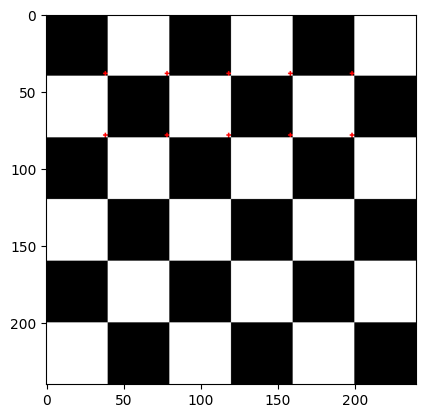

In [32]:
task4(chess)

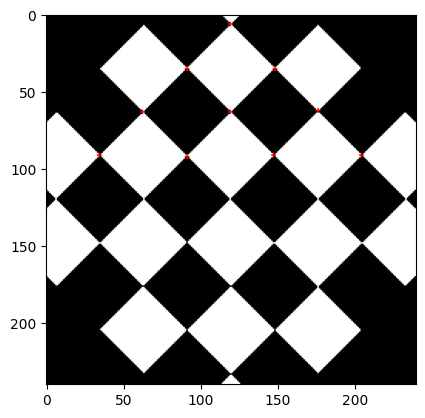

In [33]:
task4(chess_rotated)

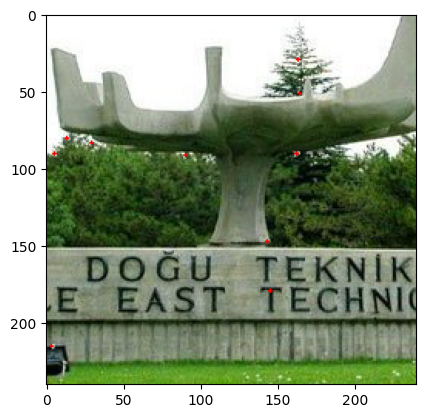

In [34]:
task4(agac)

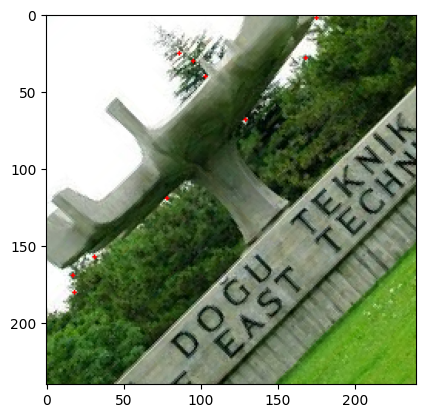

In [35]:
task4(agac_rotated)

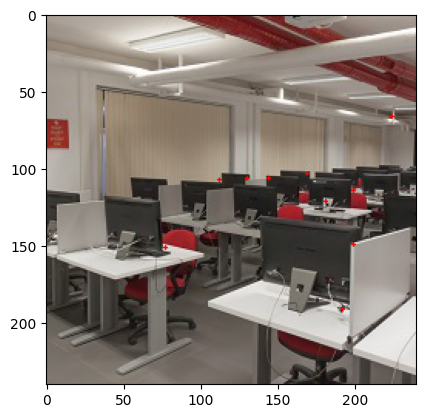

In [36]:
task4(lab)

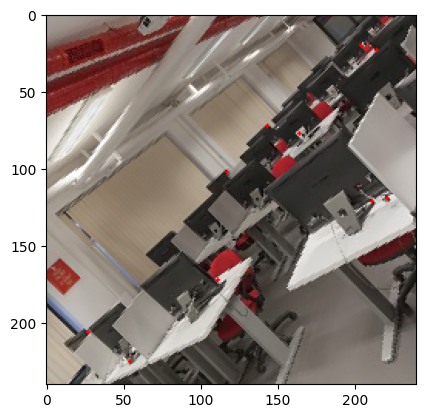

In [37]:
task4(lab_rotated)

### Task 5: R function as corner score + Uniform Weighting + Non-Maximum Suppression

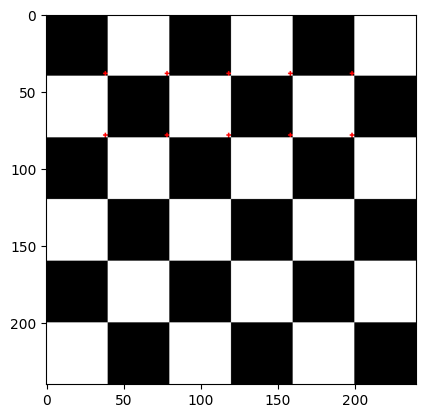

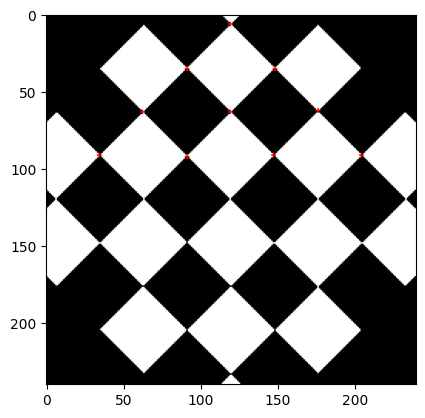

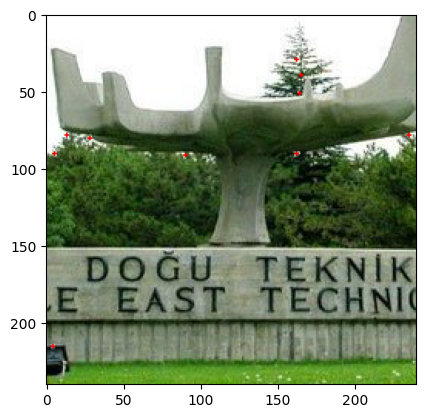

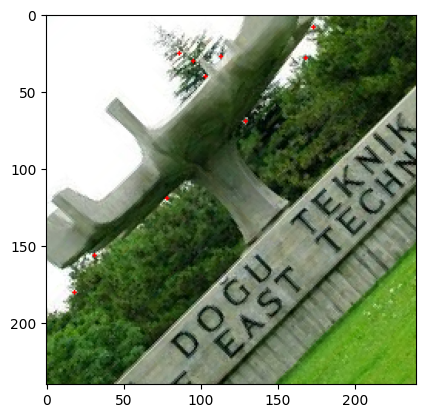

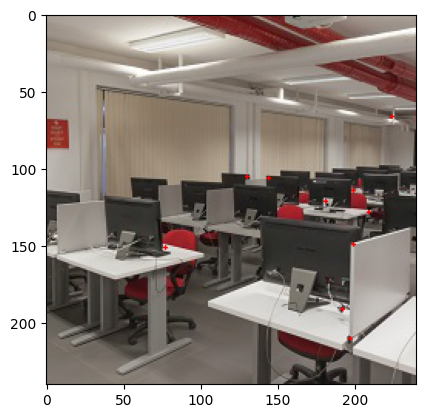

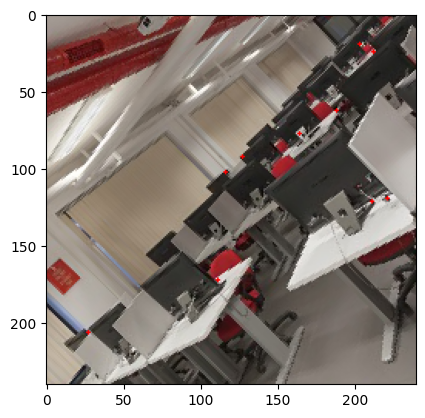

In [38]:
## Write your code here

def calculate_r(k, start_x, stop_x, start_y, stop_y, Ixx, Ixy, Iyy, Iyx):
    H = np.array([[np.sum(Ixx[start_x:stop_x, start_y: stop_y]),np.sum(Ixy[start_x:stop_x, start_y: stop_y])],
              [np.sum(Iyx[start_x:stop_x, start_y: stop_y]),np.sum(Iyy[start_x:stop_x, start_y: stop_y])]])
    H = np.linalg.eigvals(H)
    eigenval_1 = H[0]
    eigenval_2 = H[1]
    return eigenval_1*eigenval_2 - k*math.pow(eigenval_1+eigenval_2,2)

def is_neighbor(p1, p2):
    np1 = np.asarray(p1)
    np2 = np.asarray(p2)
    subs = np.subtract(np1,np2)
    norm = np.linalg.norm(subs)
    if(norm<=10):
        return True
    return False

def task5(img):
    new_img = np.copy(img)
    gray_img = rgb2gray(img)
    Ixx, Ixy, Iyy, Iyx = sobel_operator(gray_img)
    window_size = 5
    mid = math.floor(window_size/2) #2
    stop = window_size #8
    length = len(gray_img)
    j=0
    result=[]
    stop_there = length-stop
    for i in range(0,stop_there):
        for j in range(0,stop_there):
            eigen_min =calculate_r(0.05, i,i+window_size,j,j+window_size, Ixx, Ixy, Iyy, Iyx)
            result.append([eigen_min,[i+mid,j+mid]])
            
    result.sort(key=lambda element:element[0],reverse=True)

    corners = []
    corners.append(result[0][1])
    num=1
    for i in range(1,len(result)):
        j=0
        is_neg = False
        while(j<len(corners)):
            p=corners[j]
            if((is_neighbor(p,result[i][1]))):
                is_neg = True
                break
            j+=1
        if(not is_neg):
            corners.append(result[i][1])
            num+=1
        if(num==10):
            break

    for p in corners:
        x=p[0]
        y=p[1]
        new_img[x][y]=[255,0,0]
        new_img[x+1][y]=[255,0,0]
        new_img[x-1][y]=[255,0,0]
        new_img[x][y+1]=[255,0,0]
        new_img[x][y-1]=[255,0,0]
    plt.imshow(new_img)
    plt.show()

for image in images:
    task5(image)

In [66]:
## This part is for discussion

'''It takes 19.7 second to run this algorith for all 6 images.
Chess: 3.2 s
Rotated Chess: 3.2 s
Agac: 3.3 s
Rotated Agac: 3.3 s
Lab: 3.4 s
Rotated Lab: 3.3 s

This algorithm is almost same as task 4 since we use eigenvalues as well.
Running time is close to the task 4 also.'''

'It takes 19.7 second to run this algorith for all 6 images.\nChess: 3.2 s\nRotated Chess: 3.2 s\nAgac: 3.3 s\nRotated Agac: 3.3 s\nLab: 3.4 s\nRotated Lab: 3.3 s\n\nThis algorithm is almost same as task 4 since we use eigenvalues as well.\nRunning time is close to the task 4 also.'

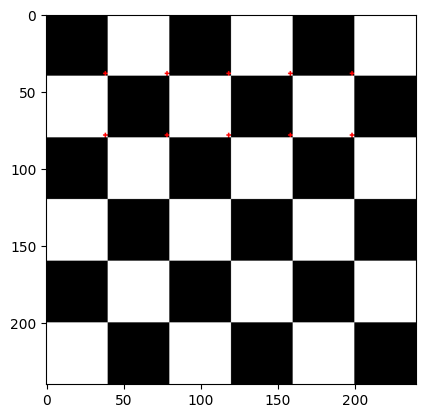

In [40]:
task5(chess)

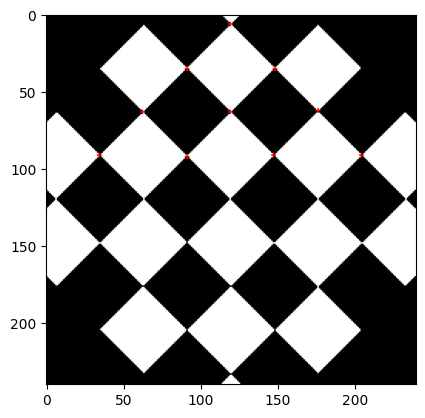

In [41]:
task5(chess_rotated)

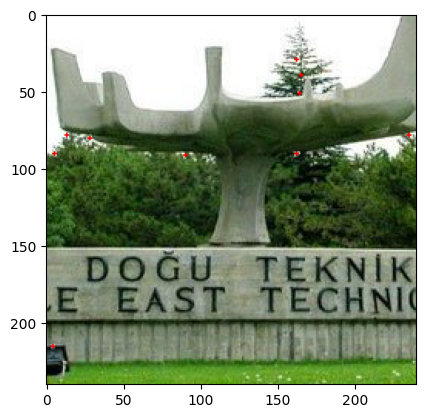

In [42]:
task5(agac)

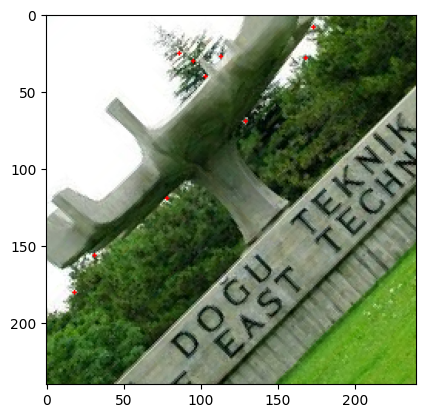

In [43]:
task5(agac_rotated)

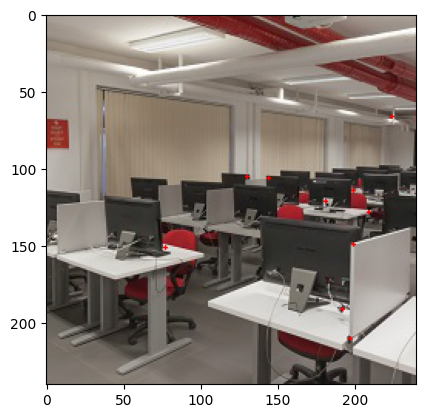

In [44]:
task5(lab)

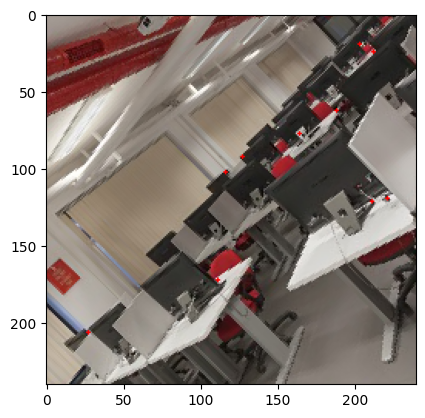

In [45]:
task5(lab_rotated)

### Task 6: R function with fast windowing based on fitering + Uniform Weighting + Non-Maximum Suppression

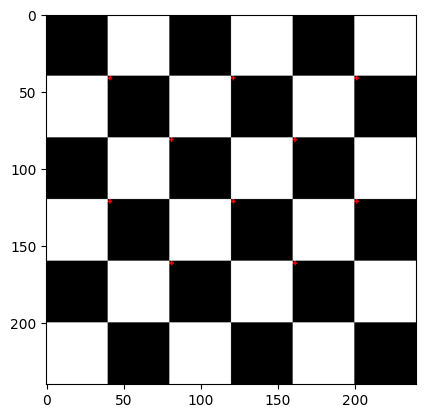

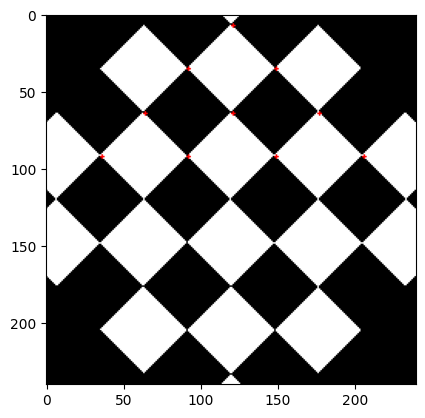

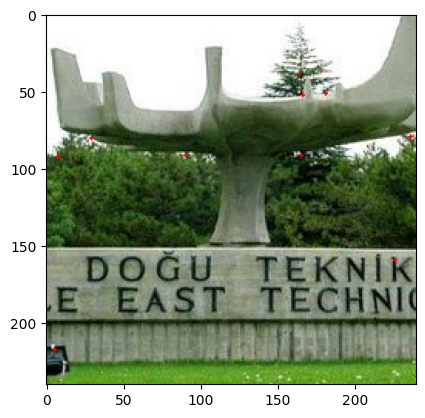

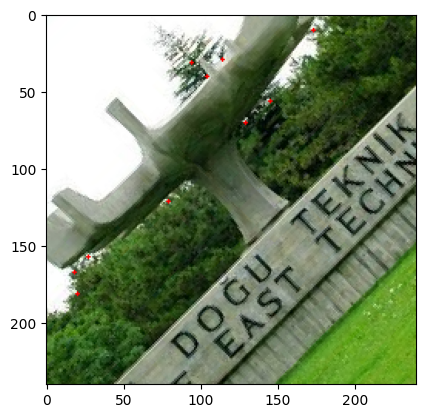

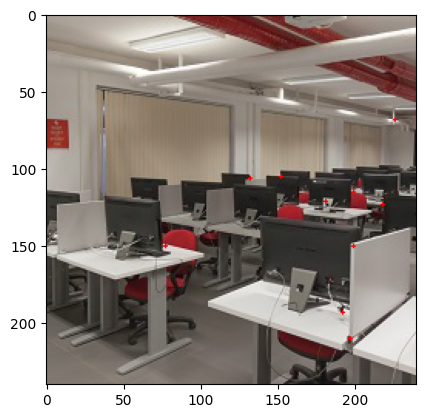

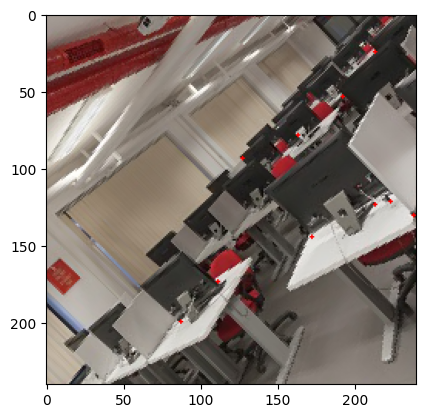

In [46]:
## Write your code here
def calculate_r_faster(k, x, y, Ixx, Ixy, Iyy, Iyx):
    H = np.array([[Ixx[x][y],Ixy[x][y]],
              [Iyx[x][y],Iyy[x][y]]])
    H = np.linalg.eigvals(H)
    eigenval_1 = H[0]
    eigenval_2 = H[1]
    return eigenval_1*eigenval_2 - k*math.pow(eigenval_1+eigenval_2,2)

def is_neighbor(p1, p2):
    np1 = np.asarray(p1)
    np2 = np.asarray(p2)
    subs = np.subtract(np1,np2)
    norm = np.linalg.norm(subs)
    if(norm<=10):
        return True
    return False

def task6(img):
    new_img = np.copy(img)
    gray_img = rgb2gray(img)
    Ixx, Ixy, Iyy, Iyx = sobel_operator(gray_img)
    uniform_filter = 1/9*np.array([[1,1,1],[1,1,1],[1,1,1]])
    Ixx = signal.convolve2d(Ixx, uniform_filter, boundary="symm")
    Ixy = signal.convolve2d(Ixy, uniform_filter, boundary="symm")
    Iyx = signal.convolve2d(Iyx, uniform_filter, boundary="symm")
    Iyy = signal.convolve2d(Iyy, uniform_filter, boundary="symm")
    length = len(gray_img)
    j=0
    result=[]
    for i in range(0,length):
        for j in range(0,length):
            eigen_min =calculate_r_faster(0.05, i,j, Ixx, Ixy, Iyy, Iyx)
            result.append([eigen_min,[i,j]])
            
    result.sort(key=lambda element:element[0],reverse=True)
    corners = []
    corners.append(result[0][1])
    num=1
    for i in range(1,len(result)):
        j=0
        is_neg = False
        while(j<len(corners)):
            p=corners[j]
            if((is_neighbor(p,result[i][1]))):
                is_neg = True
                break
            j+=1
        if(not is_neg):
            corners.append(result[i][1])
            num+=1
        if(num==10):
            break
    # print(corners)
    for p in corners:
        x=p[0]
        y=p[1]
        new_img[x][y]=[255,0,0]
        new_img[x+1][y]=[255,0,0]
        new_img[x-1][y]=[255,0,0]
        new_img[x][y+1]=[255,0,0]
        new_img[x][y-1]=[255,0,0]
    plt.imshow(new_img)
    plt.show()

for image in images:
    task6(image)

In [65]:
## This part is for discussion
'''It takes 13.7 second to run this algorith for all 6 images.
Chess: 1.9 s
Rotated Chess: 1.9 s
Agac: 2.1 s
Rotated Agac: 2.1 s
Lab: 2.1 s
Rotated Lab: 2.1 s

This part is faster than most of the tasks same as task 7, since we do filtering once and use the results for scoring.'''


'It takes 13.7 second to run this algorith for all 6 images.\nChess: 1.9 s\nRotated Chess: 1.9 s\nAgac: 2.1 s\nRotated Agac: 2.1 s\nLab: 2.1 s\nRotated Lab: 2.1 s\n\nThis part is faster than most of the tasks same as task 7, since we do filtering once and use the results for scoring.'

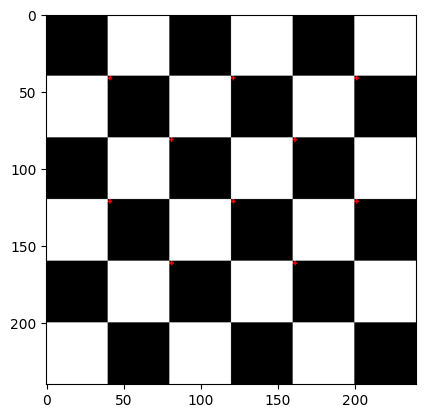

In [48]:
task6(chess)

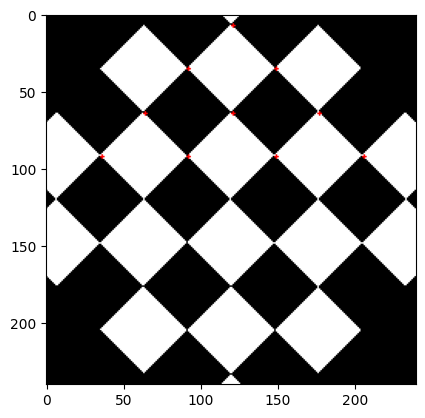

In [49]:
task6(chess_rotated)

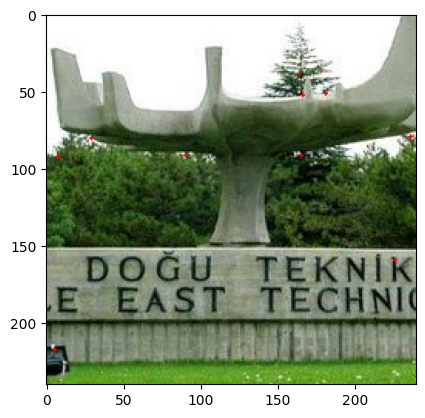

In [50]:
task6(agac)

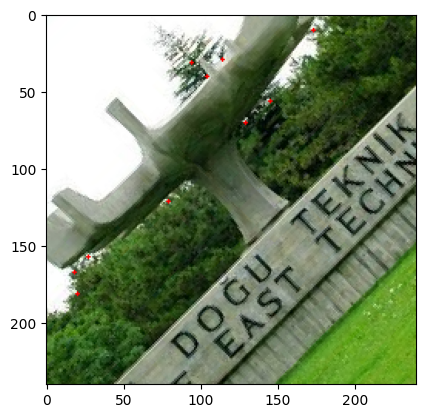

In [51]:
task6(agac_rotated)

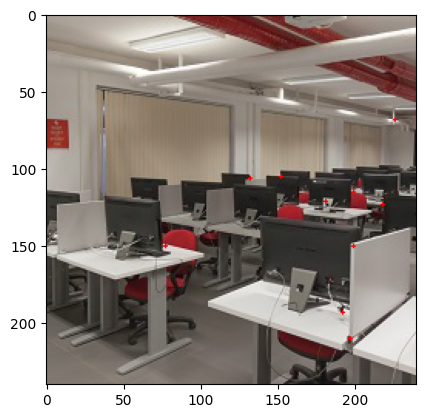

In [52]:
task6(lab)

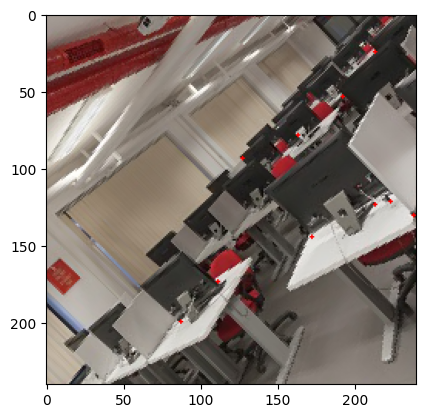

In [53]:
task6(lab_rotated)

### Task 7: R function with fast windowing based on fitering + Gaussian Weighting + Non-Maximum Suppression

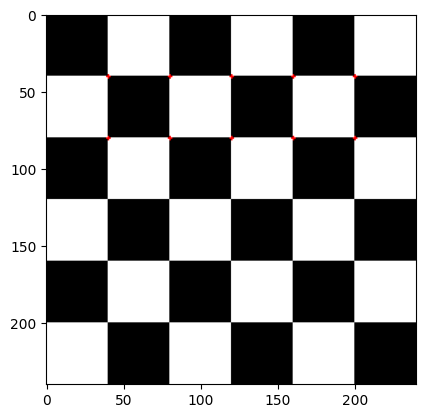

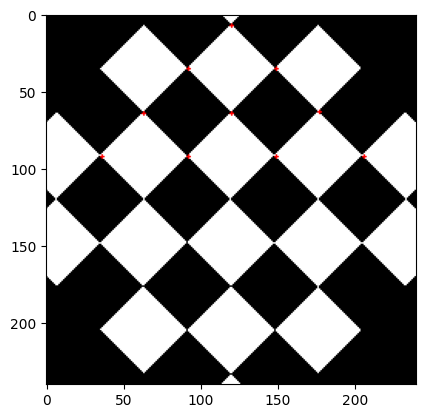

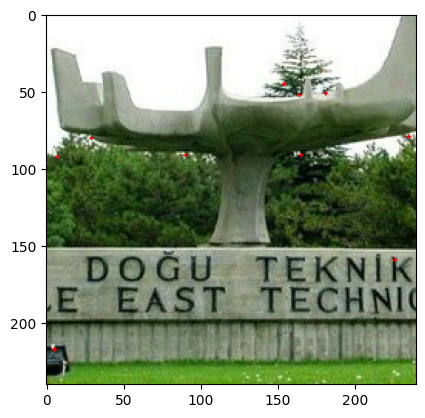

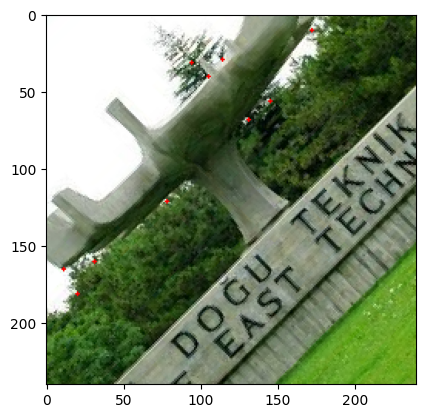

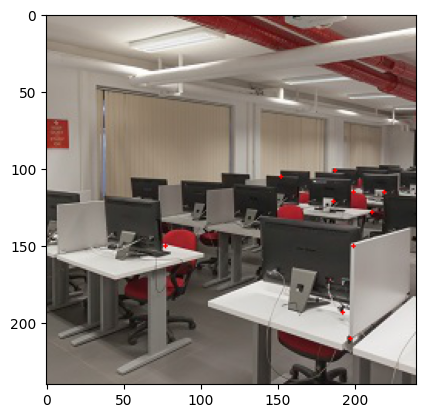

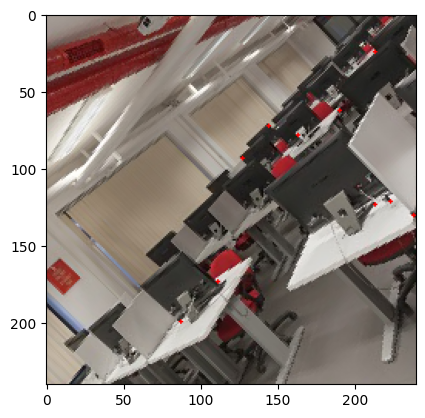

In [54]:
## Write your code here
def calculate_r(k, x, y, Ixx, Ixy, Iyy, Iyx):
    H = np.array([[Ixx[x][y],Ixy[x][y]],
              [Iyx[x][y],Iyy[x][y]]])
    H = np.linalg.eigvals(H)
    eigenval_1 = H[0]
    eigenval_2 = H[1]
    return eigenval_1*eigenval_2 - k*math.pow(eigenval_1+eigenval_2,2)

def is_neighbor(p1, p2):
    np1 = np.asarray(p1)
    np2 = np.asarray(p2)
    subs = np.subtract(np1,np2)
    norm = np.linalg.norm(subs)
    if(norm<=10):
        return True
    return False

def task7(img):
    new_img = np.copy(img)
    gray_img = rgb2gray(img)
    Ixx, Ixy, Iyy, Iyx = sobel_operator(gray_img)
    gaussian_filter = 1/16*np.array([[1,2,1],[2,4,2],[1,2,1]])
    Ixx = signal.convolve2d(Ixx, gaussian_filter, boundary="symm")
    Ixy = signal.convolve2d(Ixy, gaussian_filter, boundary="symm")
    Iyx = signal.convolve2d(Iyx, gaussian_filter, boundary="symm")
    Iyy = signal.convolve2d(Iyy, gaussian_filter, boundary="symm")
    length = len(gray_img)
    j=0
    result=[]
    for i in range(0,length):
        for j in range(0,length):
            eigen_min =calculate_r(0.05, i,j, Ixx, Ixy, Iyy, Iyx)
            result.append([eigen_min,[i,j]])
            
    result.sort(key=lambda element:element[0],reverse=True)
    corners = []
    corners.append(result[0][1])
    num=1
    for i in range(1,len(result)):
        j=0
        is_neg = False
        while(j<len(corners)):
            p=corners[j]
            if((is_neighbor(p,result[i][1]))):
                is_neg = True
                break
            j+=1
        if(not is_neg):
            corners.append(result[i][1])
            num+=1
        if(num==10):
            break
    for p in corners:
        x=p[0]
        y=p[1]
        new_img[x][y]=[255,0,0]
        new_img[x+1][y]=[255,0,0]
        new_img[x-1][y]=[255,0,0]
        new_img[x][y+1]=[255,0,0]
        new_img[x][y-1]=[255,0,0]
    plt.imshow(new_img)
    plt.show()

for image in images:
    task7(image)

In [64]:
## This part is for discussion
'''It takes 12.4 second to run this algorith for all 6 images.
Chess: 1.9 s
Rotated Chess: 2.3 s
Agac: 2.1 s
Rotated Agac: 2.1 s
Lab: 2.2 s
Rotated Lab: 2.2 s


This part is faster than most of the tasks same as task 6, since we do filtering once and use the results for scoring.


My overall comment for the Harris Corner Detection algorithm that I have written is that;
All 7 implementation are not rotation invariant for top 10 corner since some of them has same score but the order of the pixels is important in my implementation.
Also using the implementations on task6 and task7 did not change the result much for the given images.'''

'It takes 12.4 second to run this algorith for all 6 images.\nChess: 1.9 s\nRotated Chess: 2.3 s\nAgac: 2.1 s\nRotated Agac: 2.1 s\nLab: 2.2 s\nRotated Lab: 2.2 s\n\n\nThis part is faster than most of the tasks same as task 6, since we do filtering once and use the results for scoring.\n\n\nMy overall comment for the Harris Corner Detection algorithm that I have written is that;\nAll 7 implementation are not rotation invariant for top 10 corner since some of them has same score but the order of the pixels is important in my implementation.\nAlso using the implementations on task6 and task7 did not change the result much for the given images.'

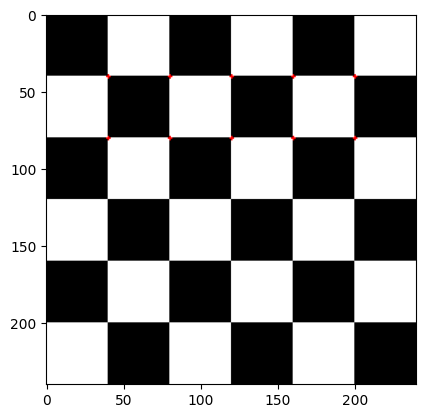

In [56]:
task7(chess)

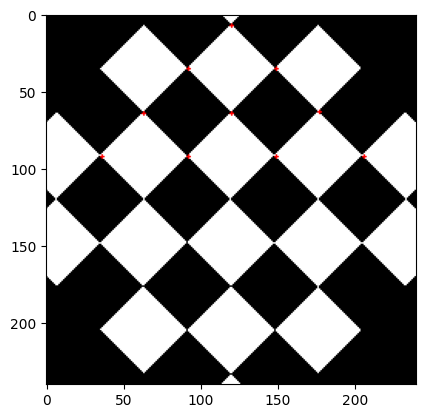

In [57]:
task7(chess_rotated)

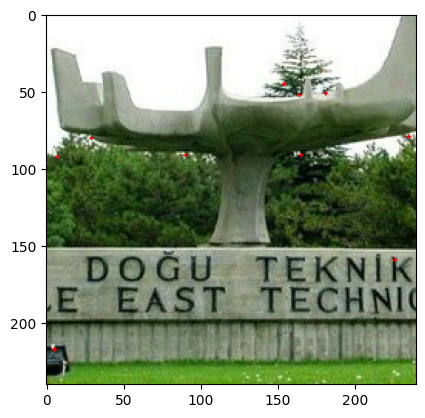

In [58]:
task7(agac)

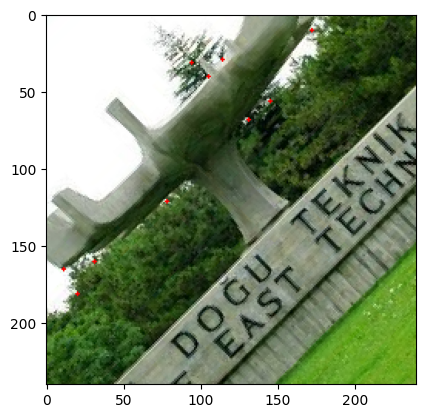

In [59]:
task7(agac_rotated)

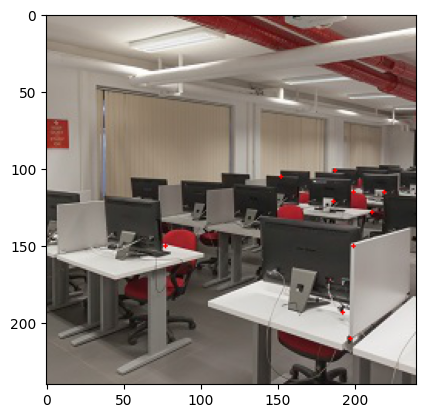

In [60]:
task7(lab)

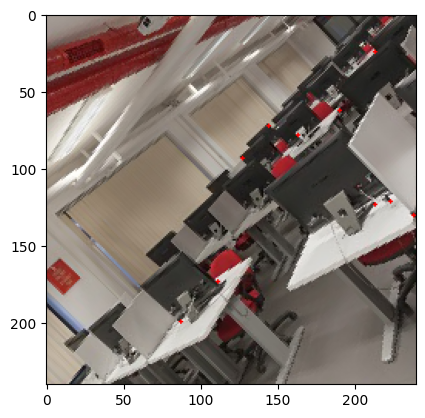

In [61]:
task7(lab_rotated)